In [1]:
import pandas as pd
pd.pandas.set_option('display.max_columns',None)


In [2]:
df = pd.read_csv('../data/average-monthly-surface-temperature.csv')

df.head()

,Entity,Code,year,Day,Average surface temperature,Average surface temperature.1
0,Afghanistan,AFG,1940,1940-01-15,-2.032494,11.327695
1,Afghanistan,AFG,1940,1940-02-15,-0.733503,11.327695
2,Afghanistan,AFG,1940,1940-03-15,1.999134,11.327695
3,Afghanistan,AFG,1940,1940-04-15,10.199754,11.327695
4,Afghanistan,AFG,1940,1940-05-15,17.942135,11.327695


In [3]:
# Переименование столбцов
df = df.rename(columns={
    'Entity': 'Country',
    'year': 'Year',
    'Average surface temperature': 'Daily average temp',
    'Average surface temperature.1': 'Yearly average temp'
})

print(df.head())

       Country Code  Year         Day  Daily average temp  Yearly average temp
0  Afghanistan  AFG  1940  1940-01-15           -2.032494            11.327695
1  Afghanistan  AFG  1940  1940-02-15           -0.733503            11.327695
2  Afghanistan  AFG  1940  1940-03-15            1.999134            11.327695
3  Afghanistan  AFG  1940  1940-04-15           10.199754            11.327695
4  Afghanistan  AFG  1940  1940-05-15           17.942135            11.327695


In [4]:
df = df.drop(columns=['Code'])

print(df.head())

       Country  Year         Day  Daily average temp  Yearly average temp
0  Afghanistan  1940  1940-01-15           -2.032494            11.327695
1  Afghanistan  1940  1940-02-15           -0.733503            11.327695
2  Afghanistan  1940  1940-03-15            1.999134            11.327695
3  Afghanistan  1940  1940-04-15           10.199754            11.327695
4  Afghanistan  1940  1940-05-15           17.942135            11.327695


In [5]:
# Преобразование столбца Day в формат datetime
df['Day'] = pd.to_datetime(df['Day'])

print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 198900 entries, 0 to 198899
Data columns (total 5 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   Country              198900 non-null  object        
 1   Year                 198900 non-null  int64         
 2   Day                  198900 non-null  datetime64[ns]
 3   Daily average temp   198900 non-null  float64       
 4   Yearly average temp  198900 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(1)
memory usage: 7.6+ MB
None


/tmp/ipykernel_82553/2706451805.py:14: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


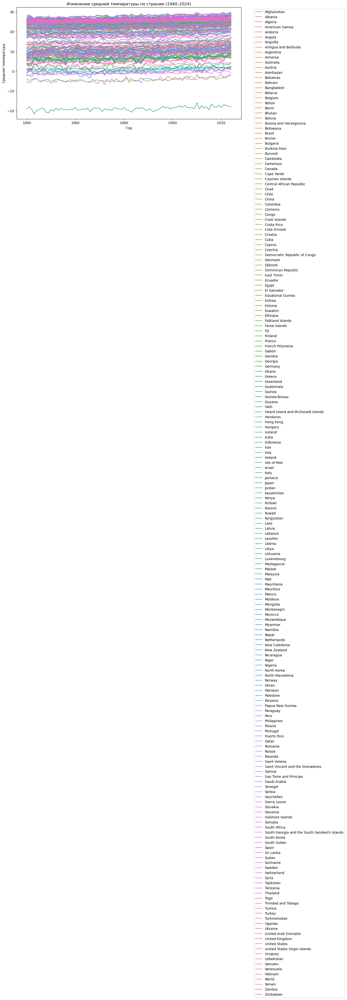

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns

# Группировка данных по году и стране
yearly_avg_temp = df.groupby(['Year', 'Country'])['Yearly average temp'].mean().reset_index()

# Построение графика
plt.figure(figsize=(12, 6))
sns.lineplot(data=yearly_avg_temp, x='Year', y='Yearly average temp', hue='Country')
plt.title('Изменение средней температуры по странам (1940–2024)')
plt.xlabel('Год')
plt.ylabel('Средняя температура')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Легенда за пределами графика
plt.tight_layout()
plt.show()

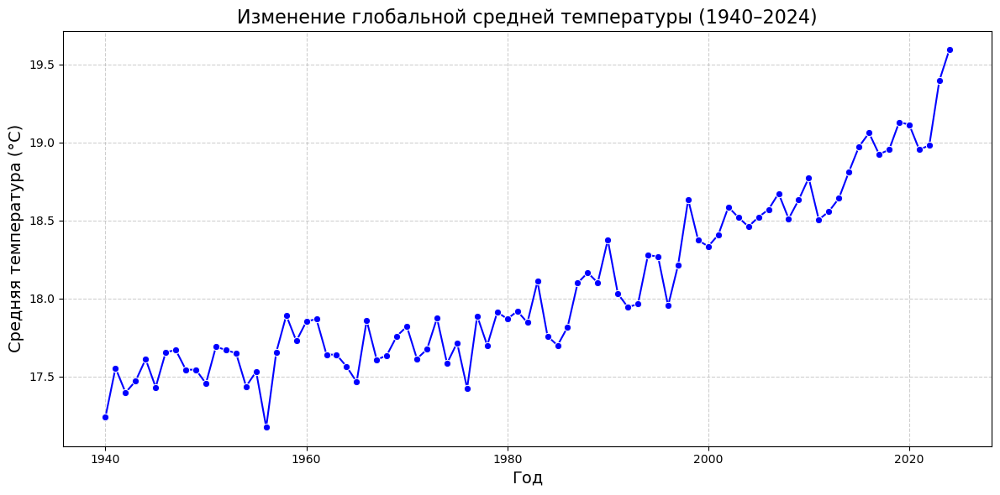

In [7]:
# Группировка данных по году (вычисляем среднюю температуру для всех стран)
global_avg_temp = df.groupby('Year')['Yearly average temp'].mean().reset_index()

# Построение графика
plt.figure(figsize=(12, 6))
sns.lineplot(data=global_avg_temp, x='Year', y='Yearly average temp', marker='o', color='b')
plt.title('Изменение глобальной средней температуры (1940–2024)', fontsize=16)
plt.xlabel('Год', fontsize=14)
plt.ylabel('Средняя температура (°C)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

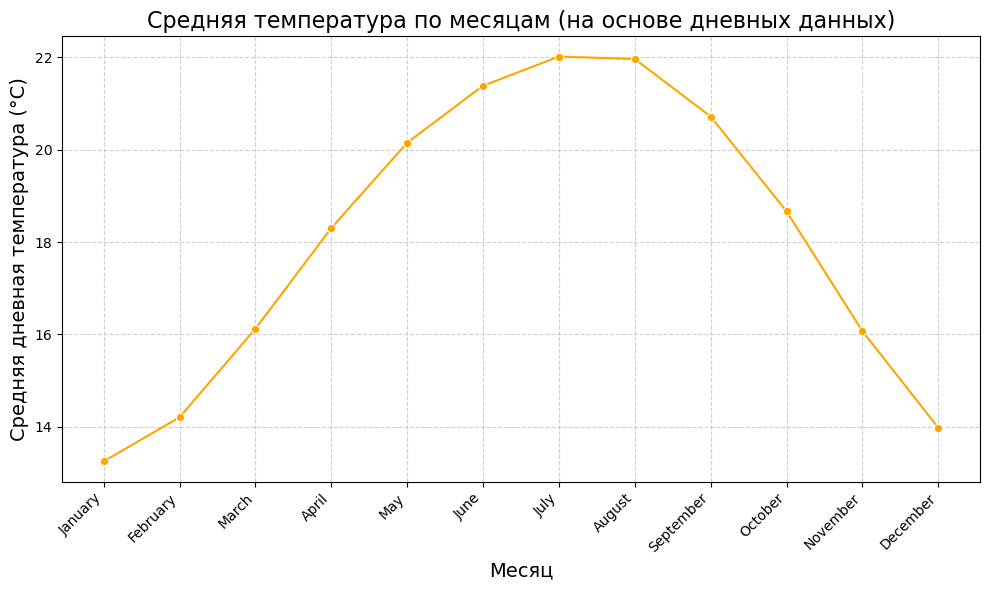

In [8]:
df['Month'] = df['Day'].dt.month

# Группируем данные по месяцу и вычисляем среднюю дневную температуру
monthly_avg_temp = df.groupby("Month")["Daily average temp"].mean()

# Указываем порядок месяцев
all_months = ["January", "February", "March", "April", "May", "June",
              "July", "August", "September", "October", "November", "December"]

# Преобразуем индекс к названиям месяцев
monthly_avg_temp.index = [all_months[i - 1] for i in monthly_avg_temp.index]

# Построение графика
plt.figure(figsize=(10, 6))
sns.lineplot(x=monthly_avg_temp.index, y=monthly_avg_temp.values, marker='o', color='orange')
plt.title("Средняя температура по месяцам (на основе дневных данных)", fontsize=16)
plt.xlabel("Месяц", fontsize=14)
plt.ylabel("Средняя дневная температура (°C)", fontsize=14)
plt.xticks(rotation=45, ha="right")  # Поворот подписей месяцев
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

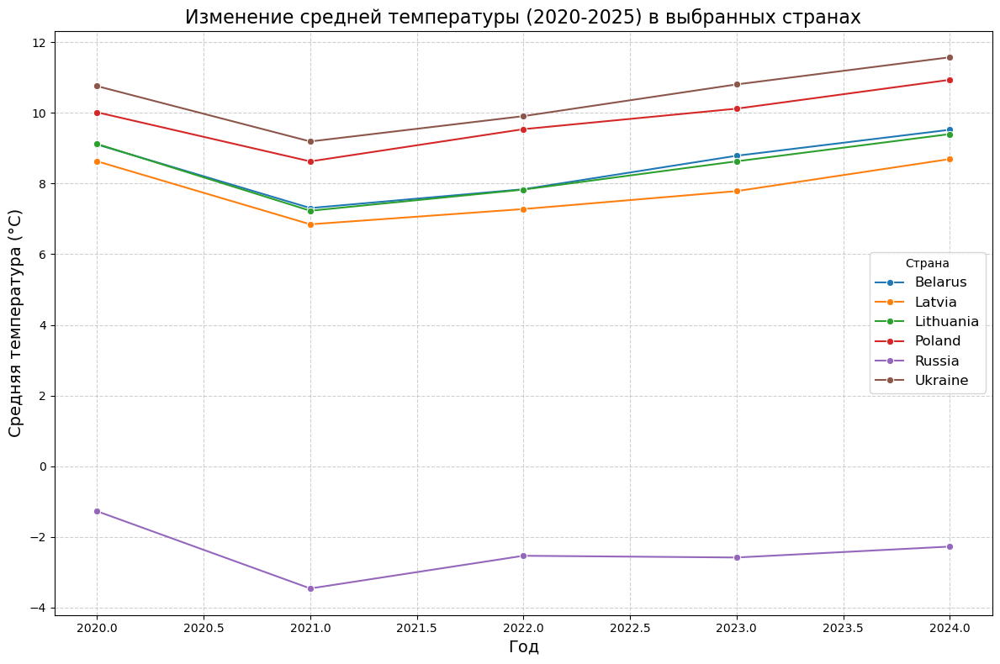

In [9]:
# Список интересующих нас стран
countries = ["Russia", "Ukraine", "Poland", "Belarus", "Latvia", "Lithuania"]

# Фильтруем данные для указанных стран и периода 2020-2025 годов
filtered_df = df[(df['Country'].isin(countries)) & (df['Year'] >= 2020) & (df['Year'] <= 2025)]

# Группируем данные по странам и годам, вычисляем среднюю дневную температуру
country_year_avg_temp = filtered_df.groupby(['Country', 'Year'])['Daily average temp'].mean().reset_index()

# Построение графика
plt.figure(figsize=(12, 8))
sns.lineplot(
    data=country_year_avg_temp,
    x="Year",
    y="Daily average temp",
    hue="Country",
    marker="o"
)
plt.title("Изменение средней температуры (2020-2025) в выбранных странах", fontsize=16)
plt.xlabel("Год", fontsize=14)
plt.ylabel("Средняя температура (°C)", fontsize=14)
plt.legend(title="Страна", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


5 самых холодных стран: ['Greenland', 'Canada', 'Russia', 'South Georgia and the South Sandwich Islands', 'Tajikistan']
5 самых жарких стран: ['Oman', 'Djibouti', 'Mali', 'Burkina Faso', 'Senegal']


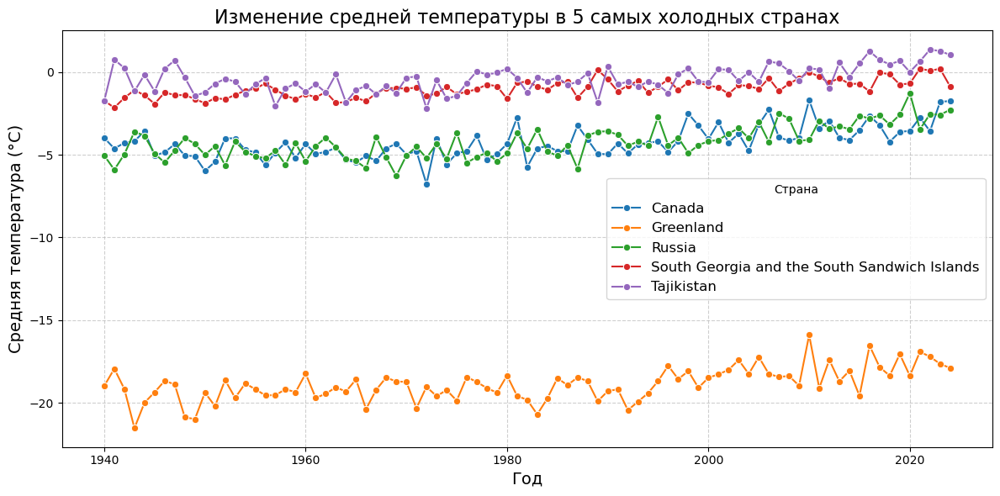

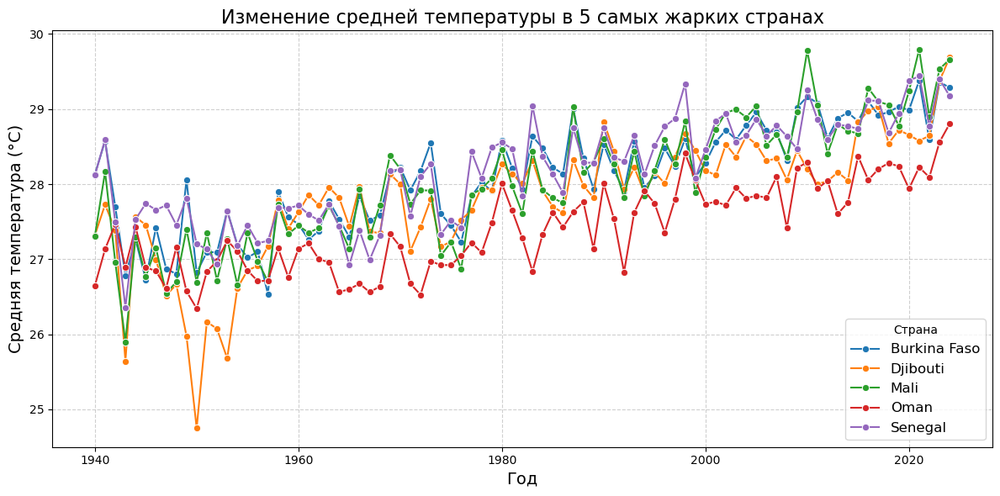

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Шаг 1: Вычисляем средние температуры по странам
avg_temps_by_country = df.groupby("Country")["Daily average temp"].mean().sort_values()

# Находим 5 самых холодных и 5 самых жарких стран
coldest_countries = avg_temps_by_country.head(5).index.tolist()
hottest_countries = avg_temps_by_country.tail(5).index.tolist()

print("5 самых холодных стран:", coldest_countries)
print("5 самых жарких стран:", hottest_countries)

# Фильтруем данные для самых холодных стран
coldest_df = df[df['Country'].isin(coldest_countries)]
coldest_avg_temp = coldest_df.groupby(['Country', 'Year'])['Daily average temp'].mean().reset_index()

# Фильтруем данные для самых жарких стран
hottest_df = df[df['Country'].isin(hottest_countries)]
hottest_avg_temp = hottest_df.groupby(['Country', 'Year'])['Daily average temp'].mean().reset_index()

# Построение графика для 5 самых холодных стран
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=coldest_avg_temp,
    x="Year",
    y="Daily average temp",
    hue="Country",
    marker="o"
)
plt.title("Изменение средней температуры в 5 самых холодных странах", fontsize=16)
plt.xlabel("Год", fontsize=14)
plt.ylabel("Средняя температура (°C)", fontsize=14)
plt.legend(title="Страна", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# Построение графика для 5 самых жарких стран
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=hottest_avg_temp,
    x="Year",
    y="Daily average temp",
    hue="Country",
    marker="o"
)
plt.title("Изменение средней температуры в 5 самых жарких странах", fontsize=16)
plt.xlabel("Год", fontsize=14)
plt.ylabel("Средняя температура (°C)", fontsize=14)
plt.legend(title="Страна", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [11]:
import plotly.express as px
from plotly.offline import plot
from IPython.display import IFrame

yearly_avg = df.groupby(['Year', 'Country'])['Daily average temp'].mean().reset_index().sort_values(by="Year")

# Создаём хлороплетную карту с анимацией
fig = px.choropleth(
    yearly_avg,
    locations="Country",  # Название стран
    locationmode="country names",  # Используем имена стран
    color="Daily average temp",  # Цветовая шкала по средним температурам
    hover_name="Country",  # Информация при наведении
    animation_frame="Year",  # Анимация по годам
    color_continuous_scale="Viridis",  # Цветовая шкала
    title="Average Temperature",  # Заголовок карты
    labels={"Daily average temp": "Average Temperature (°C)"}
)

# Настройка карты
fig.update_layout(
    geo=dict(showframe=False, projection_type="natural earth"),  # Проекция карты
    coloraxis_colorbar=dict(title="Average Temperature (°C)")  # Цветовая шкала
)

# Сохранение карты в HTML-файл
filename = "Map.html"
plot(fig, filename=filename, auto_open=False)

# Отображение карты
display(IFrame(filename, width=1000, height=800))

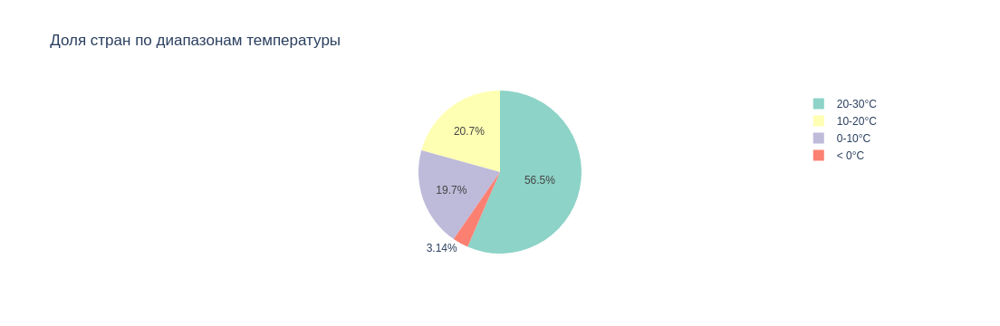

In [12]:
# Категоризация температур
df['Temp Range'] = pd.cut(
    df['Yearly average temp'],
    bins=[-50, 0, 10, 20, 30, 50],
    labels=["< 0°C", "0-10°C", "10-20°C", "20-30°C", "> 30°C"]
)

# Построение круговой диаграммы
fig = px.pie(
    df,
    names="Temp Range",
    title="Доля стран по диапазонам температуры",
    color_discrete_sequence=px.colors.qualitative.Set3
)

fig.show()

In [13]:
df.head()

,Country,Year,Day,Daily average temp,Yearly average temp,Month,Temp Range
0,Afghanistan,1940,1940-01-15,-2.032494,11.327695,1,10-20°C
1,Afghanistan,1940,1940-02-15,-0.733503,11.327695,2,10-20°C
2,Afghanistan,1940,1940-03-15,1.999134,11.327695,3,10-20°C
3,Afghanistan,1940,1940-04-15,10.199754,11.327695,4,10-20°C
4,Afghanistan,1940,1940-05-15,17.942135,11.327695,5,10-20°C


In [14]:
df['Day_of_Month'] = df['Day'].dt.day
df.head()

,Country,Year,Day,Daily average temp,Yearly average temp,Month,Temp Range,Day_of_Month
0,Afghanistan,1940,1940-01-15,-2.032494,11.327695,1,10-20°C,15
1,Afghanistan,1940,1940-02-15,-0.733503,11.327695,2,10-20°C,15
2,Afghanistan,1940,1940-03-15,1.999134,11.327695,3,10-20°C,15
3,Afghanistan,1940,1940-04-15,10.199754,11.327695,4,10-20°C,15
4,Afghanistan,1940,1940-05-15,17.942135,11.327695,5,10-20°C,15


ElasticNet - Средняя абсолютная ошибка (MAE): 3.78
ElasticNet - Среднеквадратичная ошибка (MSE): 28.54
ElasticNet - Коэффициент детерминации (R²): 0.73


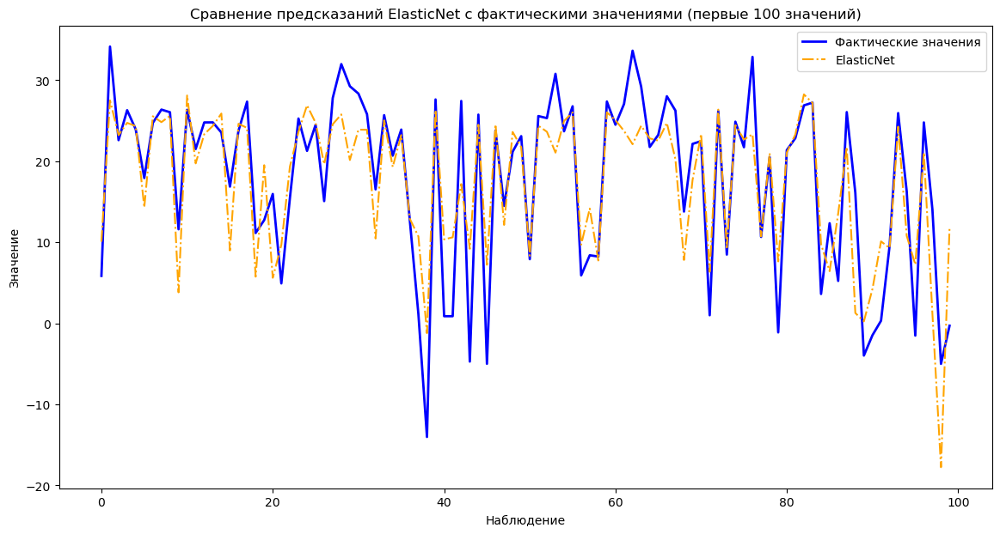

In [15]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Подготовка данных
X = df[['Country', 'Year', 'Month', 'Day_of_Month', 'Yearly average temp']]
y = df['Daily average temp']

# Разделяем числовые и категориальные признаки
numeric_features = ['Year', 'Month', 'Day_of_Month', 'Yearly average temp']
categorical_features = ['Country']

# Создаем пайплайн для обработки данных
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),  # Масштабируем числовые признаки
        ('cat', OneHotEncoder(), categorical_features)  # Кодируем категориальные признаки
    ]
)

# Преобразуем данные
X = preprocessor.fit_transform(X)

# Разделяем данные на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Создаем модель ElasticNet
elastic_net = ElasticNet(alpha=0.1, l1_ratio=0.5, random_state=42)

# Обучаем модель ElasticNet
elastic_net.fit(X_train, y_train)

# Делаем прогнозы на тестовом наборе
y_pred_en = elastic_net.predict(X_test)

# Вычисление метрик для ElasticNet
mae_en = mean_absolute_error(y_test, y_pred_en)
mse_en = mean_squared_error(y_test, y_pred_en)
r2_en = r2_score(y_test, y_pred_en)

print(f"ElasticNet - Средняя абсолютная ошибка (MAE): {mae_en:.2f}")
print(f"ElasticNet - Среднеквадратичная ошибка (MSE): {mse_en:.2f}")
print(f"ElasticNet - Коэффициент детерминации (R²): {r2_en:.2f}")

# Визуализируем предсказания ElasticNet и фактические значения (первые 50 значений)
plt.figure(figsize=(14, 7))
plt.plot(range(100), y_test.iloc[:100], label='Фактические значения', color='blue', linewidth=2)
plt.plot(range(100), y_pred_en[:100], label='ElasticNet', color='orange', linestyle='-.')
plt.xlabel('Наблюдение')
plt.ylabel('Значение')
plt.title('Сравнение предсказаний ElasticNet с фактическими значениями (первые 100 значений)')
plt.legend()
plt.show()

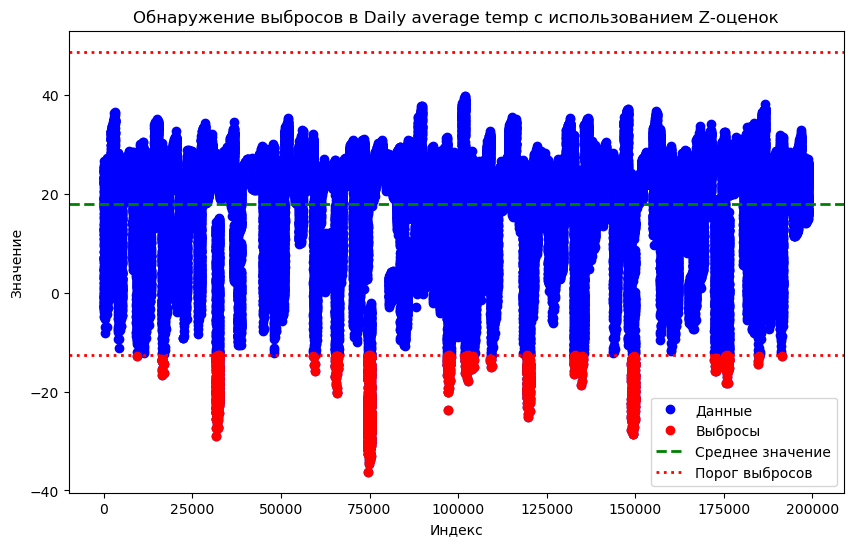

Страны с выбросами:
           Country        Day  Daily average temp
9468       Armenia 1964-01-15          -12.798158
16320      Belarus 1940-01-15          -15.774104
16321      Belarus 1940-02-15          -13.711987
16332      Belarus 1941-01-15          -13.889651
16344      Belarus 1942-01-15          -16.723600
...            ...        ...                 ...
184644     Ukraine 1942-01-15          -14.357440
184789     Ukraine 1954-02-15          -13.731473
184813     Ukraine 1956-02-15          -12.721913
184896     Ukraine 1963-01-15          -13.107550
191556  Uzbekistan 2008-01-15          -12.787503

[2093 rows x 3 columns]

Уникальные страны с выбросами:
['Armenia' 'Belarus' 'Canada' 'Estonia' 'Finland' 'Greenland' 'Kazakhstan'
 'Kyrgyzstan' 'Latvia' 'Lithuania' 'Mongolia' 'North Korea' 'Norway'
 'Russia' 'Sweden' 'Tajikistan' 'Ukraine' 'Uzbekistan']


In [16]:
import numpy as np

# Выбираем столбец для анализа выбросов
column = 'Daily average temp'
data = df[column]

# Вычисление Z-оценок
mean = np.mean(data)
std_dev = np.std(data)
z_scores = [(x - mean) / std_dev for x in data]

# Определение порога для выбросов
threshold = 3

# Поиск выбросов
outliers = np.where(np.abs(z_scores) > threshold)

# Визуализация данных и выбросов
plt.figure(figsize=(10, 6))
plt.plot(range(len(data)), data, 'bo', label='Данные')  # Все данные
plt.plot(outliers[0], data.iloc[outliers], 'ro', label='Выбросы')  # Выбросы
plt.axhline(mean, color='g', linestyle='dashed', linewidth=2, label='Среднее значение')  # Среднее значение
plt.axhline(mean + threshold * std_dev, color='r', linestyle='dotted', linewidth=2, label='Порог выбросов')  # Верхний порог
plt.axhline(mean - threshold * std_dev, color='r', linestyle='dotted', linewidth=2)  # Нижний порог

plt.title(f'Обнаружение выбросов в {column} с использованием Z-оценок')
plt.xlabel('Индекс')
plt.ylabel('Значение')
plt.legend()
plt.show()

# Вывод найденных выбросов с их странами
outlier_rows = df.iloc[outliers]
print("Страны с выбросами:")
print(outlier_rows[['Country', 'Day', column]])

# Уникальный список стран с выбросами
unique_countries = outlier_rows['Country'].unique()
print("\nУникальные страны с выбросами:")
print(unique_countries)

Страны с выбросами:
               Country        Day  Daily average temp
3631    American Samoa 1987-08-15           24.895966
4070    American Samoa 2024-03-15           28.354340
4071    American Samoa 2024-04-15           28.323090
4072    American Samoa 2024-05-15           28.153412
21690          Bolivia 1962-07-15           14.069110
...                ...        ...                 ...
184610          Uganda 2024-03-15           26.075933
193621       Venezuela 2010-02-15           27.657839
193622       Venezuela 2010-03-15           27.841398
193694       Venezuela 2016-03-15           28.143974
193790       Venezuela 2024-03-15           28.435184

[83 rows x 3 columns]

Уникальные страны с выбросами:
['American Samoa' 'Bolivia' 'Brazil' 'Burundi' 'Cambodia' 'Cameroon'
 'Central African Republic' 'Colombia' 'Congo' 'Costa Rica' 'Cuba'
 'Democratic Republic of Congo' 'El Salvador' 'Ethiopia' 'Gambia'
 'Guatemala' 'Guyana' 'Heard Island and McDonald Islands' 'Honduras'
 'Keny

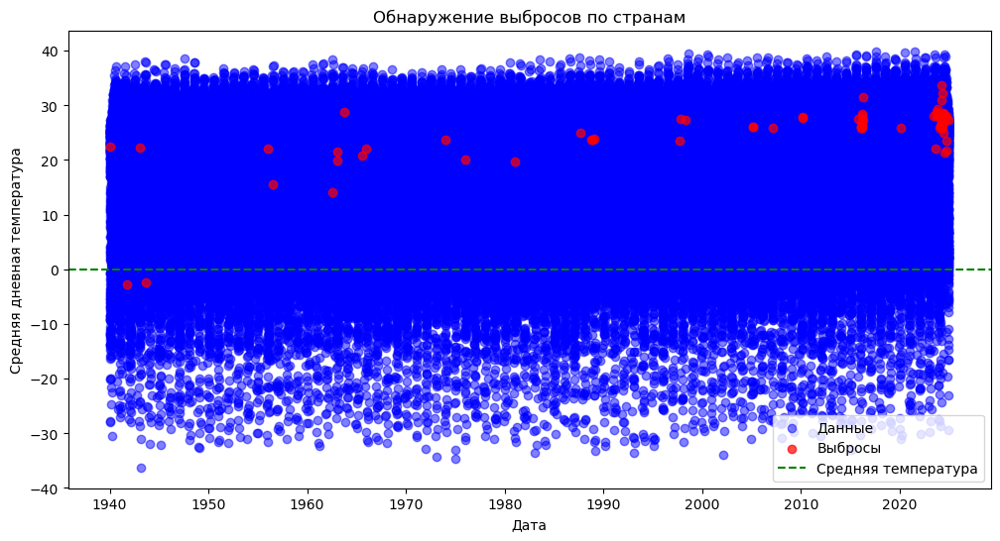

In [17]:
# Вычисляем Z-оценки для каждой страны отдельно
df['Z_Score'] = df.groupby('Country')['Daily average temp'].transform(
    lambda x: (x - x.mean()) / x.std()
)

# Добавляем столбец с отметкой о выбросах
df['Outlier'] = np.abs(df['Z_Score']) > threshold

# Фильтруем выбросы
outlier_rows = df[df['Outlier']]

# Вывод стран с выбросами
print("Страны с выбросами:")
print(outlier_rows[['Country', 'Day', 'Daily average temp']])

# Уникальные страны с выбросами
unique_countries = outlier_rows['Country'].unique()
print("\nУникальные страны с выбросами:")
print(unique_countries)

# Визуализация данных и выбросов
plt.figure(figsize=(12, 6))
plt.scatter(df['Day'], df['Daily average temp'], c='blue', label='Данные', alpha=0.5)
plt.scatter(outlier_rows['Day'], outlier_rows['Daily average temp'], c='red', label='Выбросы', alpha=0.7)
plt.axhline(0, color='green', linestyle='--', label='Средняя температура')
plt.title('Обнаружение выбросов по странам')
plt.xlabel('Дата')
plt.ylabel('Средняя дневная температура')
plt.legend()
plt.show()

Страны с выбросами:
               Country        Day  Season  Daily average temp
288        Afghanistan 1964-01-15  Winter           -8.053513
1044           Albania 1942-01-15  Winter           -3.048579
4070    American Samoa 2024-03-15  Spring           28.354340
4071    American Samoa 2024-04-15  Spring           28.323090
4072    American Samoa 2024-05-15  Spring           28.153412
...                ...        ...     ...                 ...
195822           World 2023-07-15  Summer           16.953165
195829           World 2024-02-15  Winter           13.539749
195931           Yemen 1947-08-15  Summer           25.669828
197869          Zambia 2024-02-15  Winter           24.553755
198505        Zimbabwe 1992-02-15  Winter           26.720402

[277 rows x 4 columns]

Уникальные страны с выбросами:
['Afghanistan' 'Albania' 'American Samoa' 'Andorra' 'Angola' 'Anguilla'
 'Antigua and Barbuda' 'Australia' 'Austria' 'Bahamas' 'Bahrain'
 'Bangladesh' 'Belarus' 'Belgium' 'Belize' 

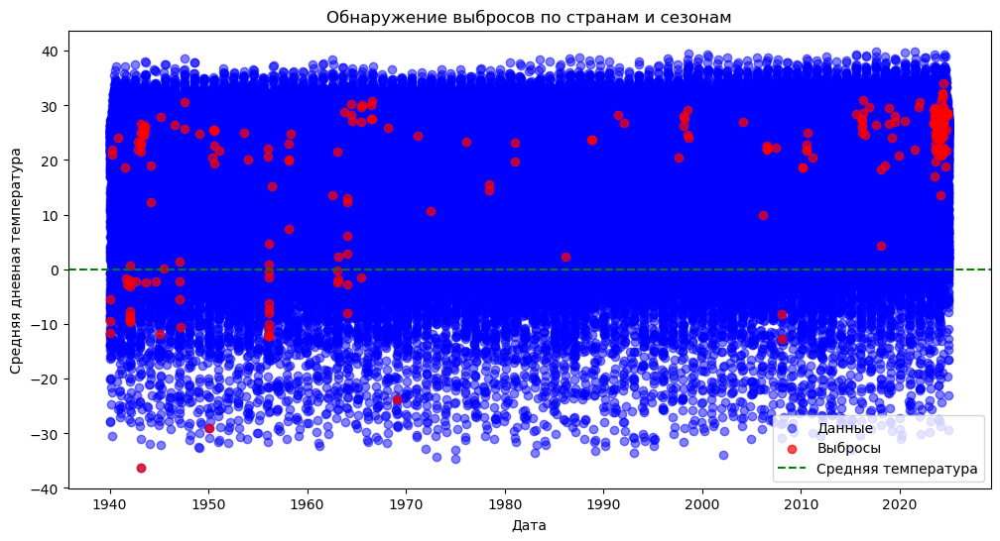

In [18]:
# Определяем сезоны на основе месяца
# Зима: Декабрь (12), Январь (1), Февраль (2)
# Весна: Март (3), Апрель (4), Май (5)
# Лето: Июнь (6), Июль (7), Август (8)
# Осень: Сентябрь (9), Октябрь (10), Ноябрь (11)
df['Season'] = pd.cut(
    df['Month'], 
    bins=[0, 3, 6, 9, 12], 
    labels=['Winter', 'Spring', 'Summer', 'Fall'],
    right=False
)

# Определяем порог выбросов
threshold = 3

# Вычисляем Z-оценки с учетом стран и сезонов
df['Z_Score'] = df.groupby(['Country', 'Season'], observed=True)['Daily average temp'].transform(
    lambda x: (x - x.mean()) / x.std()
)

# Добавляем столбец с отметкой о выбросах
df['Outlier'] = np.abs(df['Z_Score']) > threshold

# Фильтруем выбросы
outlier_rows = df[df['Outlier']]

# Вывод стран с выбросами
print("Страны с выбросами:")
print(outlier_rows[['Country', 'Day', 'Season', 'Daily average temp']])

# Уникальные страны с выбросами
unique_countries = outlier_rows['Country'].unique()
print("\nУникальные страны с выбросами:")
print(unique_countries)

# Визуализация данных и выбросов
plt.figure(figsize=(12, 6))
plt.scatter(df['Day'], df['Daily average temp'], c='blue', label='Данные', alpha=0.5)
plt.scatter(outlier_rows['Day'], outlier_rows['Daily average temp'], c='red', label='Выбросы', alpha=0.7)
plt.axhline(0, color='green', linestyle='--', label='Средняя температура')
plt.title('Обнаружение выбросов по странам и сезонам')
plt.xlabel('Дата')
plt.ylabel('Средняя дневная температура')
plt.legend()
plt.show()